In [1]:
import pandas as pd
import numpy as np
import os
    
import missingno as msno
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import folium
import math
import warnings

from datetime import datetime
import datetime
from matplotlib import pyplot as plt
from scipy.stats import uniform
from textwrap import wrap


from sklearn.base import TransformerMixin, BaseEstimator, clone
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, ExtraTreesRegressor
from sklearn.experimental import enable_iterative_imputer
from sklearn.feature_extraction import FeatureHasher
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, GridSearchCV, RandomizedSearchCV, KFold
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.preprocessing import StandardScaler, LabelBinarizer, OneHotEncoder, LabelEncoder
from sklearn.svm import SVR
from sklearn import dummy



### ETUDE DU DATAFRAME

In [2]:
df= pd.read_csv('Energy.csv')

In [3]:
df

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,...,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,5.252517e+05,1.792159e+06,39737.390630,3.973739e+06,False,NaN,Compliant,NaN,223.54,16.99
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,1.022480e+05,3.488702e+05,3706.010010,3.706010e+05,False,NaN,Compliant,NaN,22.11,1.57


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [5]:
df.describe()

,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,...,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity
count,3376.000000,3376.0,3360.000000,3376.000000,3376.000000,3376.000000,3376.000000,3368.000000,3376.000000,3.376000e+03,...,3.371000e+03,3.370000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,0.0,3367.000000,3367.000000
mean,21208.991114,2016.0,98116.949107,4.439277,47.624033,-122.334795,1968.573164,1.106888,4.709123,9.483354e+04,...,5.403667e+06,5.276726e+06,2.745959e+05,1.086639e+06,3.707612e+06,1.368505e+04,1.368505e+06,NaN,119.723971,1.175916
std,12223.757015,0.0,18.615205,2.120625,0.047758,0.027203,33.088156,2.108402,5.494465,2.188376e+05,...,2.161063e+07,1.593879e+07,3.912173e+06,4.352478e+06,1.485066e+07,6.709781e+04,6.709781e+06,NaN,538.832227,1.821452
min,1.000000,2016.0,98006.000000,1.000000,47.499170,-122.414250,1900.000000,0.000000,0.000000,1.128500e+04,...,0.000000e+00,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,NaN,-0.800000,-0.020000
25%,19990.750000,2016.0,98105.000000,3.000000,47.599860,-122.350662,1948.000000,1.000000,2.000000,2.848700e+04,...,9.251286e+05,9.701822e+05,0.000000e+00,1.874229e+05,6.394870e+05,0.000000e+00,0.000000e+00,NaN,9.495000,0.210000
50%,23112.000000,2016.0,98115.000000,4.000000,47.618675,-122.332495,1975.000000,1.000000,4.000000,4.417500e+04,...,1.803753e+06,1.904452e+06,0.000000e+00,3.451299e+05,1.177583e+06,3.237538e+03,3.237540e+05,NaN,33.920000,0.610000
75%,25994.250000,2016.0,98122.000000,7.000000,47.657115,-122.319407,1997.000000,1.000000,5.000000,9.099200e+04,...,4.222455e+06,4.381429e+06,0.000000e+00,8.293178e+05,2.829632e+06,1.189033e+04,1.189034e+06,NaN,93.940000,1.370000
max,50226.000000,2016.0,98272.000000,7.000000,47.733870,-122.220966,2015.000000,111.000000,99.000000,9.320156e+06,...,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,NaN,16870.980000,34.090000


### REMPLISSAGE DU DATAFRAME

In [6]:
df.isna().sum()

OSEBuildingID                         0
DataYear                              0
BuildingType                          0
PrimaryPropertyType                   0
PropertyName                          0
Address                               0
City                                  0
State                                 0
ZipCode                              16
TaxParcelIdentificationNumber         0
CouncilDistrictCode                   0
Neighborhood                          0
Latitude                              0
Longitude                             0
YearBuilt                             0
NumberofBuildings                     8
NumberofFloors                        0
PropertyGFATotal                      0
PropertyGFAParking                    0
PropertyGFABuilding(s)                0
ListOfAllPropertyUseTypes             9
LargestPropertyUseType               20
LargestPropertyUseTypeGFA            20
SecondLargestPropertyUseType       1697
SecondLargestPropertyUseTypeGFA    1697


In [7]:
for i in df.columns:
    sum_nan =sum(df[i].isna())
    sum_rows =len(df)
    nan_percent = sum_nan/sum_rows*100
    print("percentage of nan in the feature {} is {} percent".format(i,nan_percent))

percentage of nan in the feature OSEBuildingID is 0.0 percent
percentage of nan in the feature DataYear is 0.0 percent
percentage of nan in the feature BuildingType is 0.0 percent
percentage of nan in the feature PrimaryPropertyType is 0.0 percent
percentage of nan in the feature PropertyName is 0.0 percent
percentage of nan in the feature Address is 0.0 percent
percentage of nan in the feature City is 0.0 percent
percentage of nan in the feature State is 0.0 percent
percentage of nan in the feature ZipCode is 0.47393364928909953 percent
percentage of nan in the feature TaxParcelIdentificationNumber is 0.0 percent
percentage of nan in the feature CouncilDistrictCode is 0.0 percent
percentage of nan in the feature Neighborhood is 0.0 percent
percentage of nan in the feature Latitude is 0.0 percent
percentage of nan in the feature Longitude is 0.0 percent
percentage of nan in the feature YearBuilt is 0.0 percent
percentage of nan in the feature NumberofBuildings is 0.23696682464454977 pe

The global filling rate of the DataFrame is : 87.15%


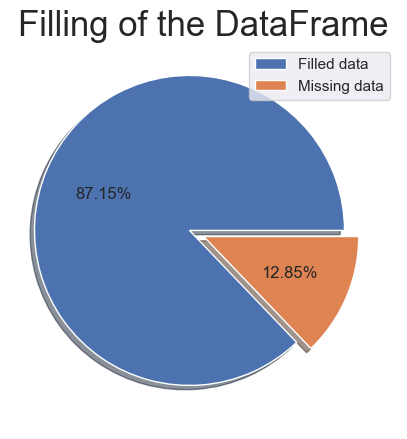

In [8]:
def filling_rate(df):
    
    
    
    nb_rows, nb_columns = df.shape

    nb_data = df.count().sum()

    filling_rate = nb_data / (nb_rows * nb_columns)
    print("The global filling rate of the DataFrame is : {:.2%}".format(filling_rate))
      
    frequencies = [filling_rate, 1 - filling_rate]
    labels = ["Filled data", "Missing data"]
    
    fig, ax = plt.subplots(figsize=(5, 5))
    plt.title("Filling of the DataFrame", fontsize=25)
    ax.axis("equal")
    explode = (0.1, 0)  

    ax.pie(frequencies,
           explode=explode,
           # labels=labels,
           autopct='%1.2f%%',
           shadow=True,
          )
    plt.legend(labels)

filling_rate(df)

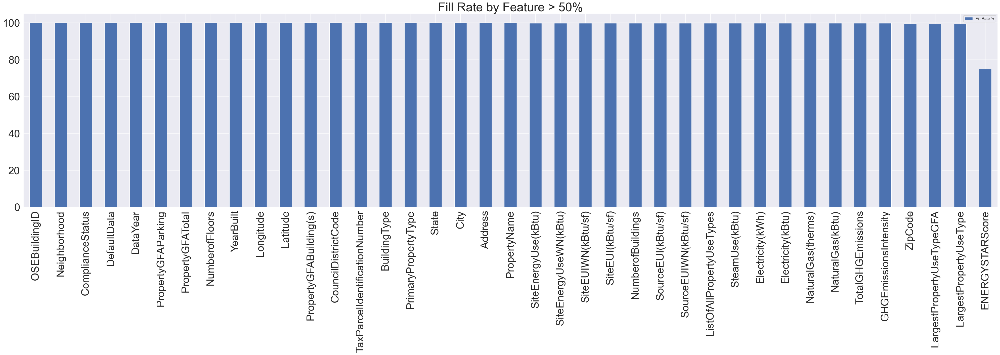

In [9]:
df_fill=round(100*df.notna().sum()/len(df),2).to_frame()
df_fill.columns=['Fill Rate %']

df_fill=df_fill[df_fill['Fill Rate %']>50]
df_fill.sort_values(by=['Fill Rate %'],ascending=False).plot.bar(figsize=(50,10),fontsize=30)
plt.title('Fill Rate by Feature > 50%',fontsize=35)
print("");

### PREPARATION DE DEUX DATAFRAMES CATEGORIEL ET NUMERIQUE

In [10]:
cat = df.select_dtypes(include=['object']).columns
cat

Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'Address',
       'City', 'State', 'TaxParcelIdentificationNumber', 'Neighborhood',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType',
       'YearsENERGYSTARCertified', 'ComplianceStatus', 'Outlier'],
      dtype='object')

In [11]:
df_cat=df[['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'Address',
       'City', 'State', 'TaxParcelIdentificationNumber', 'Neighborhood',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType',
       'YearsENERGYSTARCertified', 'ComplianceStatus', 'Outlier']]
df_cat

,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,TaxParcelIdentificationNumber,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,YearsENERGYSTARCertified,ComplianceStatus,Outlier
0,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,0659000030,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN,Compliant,NaN
1,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,0659000220,DOWNTOWN,"Hotel, Parking, Restaurant",Hotel,Parking,Restaurant,NaN,Compliant,NaN
2,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,0659000475,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN,Compliant,NaN
3,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,0659000640,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN,Compliant,NaN
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,0659000970,DOWNTOWN,"Hotel, Parking, Swimming Pool",Hotel,Parking,Swimming Pool,NaN,Compliant,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,1624049080,GREATER DUWAMISH,Office,Office,NaN,NaN,NaN,Error - Correct Default Data,NaN
3372,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,3558300000,DOWNTOWN,Other - Recreation,Other - Recreation,NaN,NaN,NaN,Compliant,NaN
3373,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,1794501150,MAGNOLIA / QUEEN ANNE,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,Fitness Center/Health Club/Gym,Swimming Pool,NaN,Compliant,NaN
3374,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,7883603155,GREATER DUWAMISH,"Fitness Center/Health Club/Gym, Food Service, ...",Other - Recreation,Fitness Center/Health Club/Gym,Pre-school/Daycare,NaN,Compliant,NaN


In [12]:
num= df.select_dtypes(include=['number']).columns
num

Index(['OSEBuildingID', 'DataYear', 'ZipCode', 'CouncilDistrictCode',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
       'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)',
       'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)',
       'Comments', 'TotalGHGEmissions', 'GHGEmissionsIntensity'],
      dtype='object')

In [13]:
df_num=df[['OSEBuildingID', 'DataYear', 'ZipCode', 'CouncilDistrictCode',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
       'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)',
       'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)',
       'Comments', 'TotalGHGEmissions', 'GHGEmissionsIntensity']]
df_num

,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,...,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,98101.0,7,47.61220,-122.33799,1927,1.0,12,88434,...,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,NaN,249.98,2.83
1,2,2016,98101.0,7,47.61317,-122.33393,1996,1.0,11,103566,...,8.387933e+06,8.664479e+06,0.00,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,NaN,295.86,2.86
2,3,2016,98101.0,7,47.61393,-122.33810,1969,1.0,41,956110,...,7.258702e+07,7.393711e+07,21566554.00,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,NaN,2089.28,2.19
3,5,2016,98101.0,7,47.61412,-122.33664,1926,1.0,10,61320,...,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,NaN,286.43,4.67
4,8,2016,98121.0,7,47.61375,-122.34047,1980,1.0,18,175580,...,1.417261e+07,1.465650e+07,0.00,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,NaN,2,47.56722,-122.31154,1990,1.0,1,12294,...,8.497457e+05,9.430032e+05,0.00,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,NaN,20.94,1.70
3372,50223,2016,NaN,2,47.59625,-122.32283,2004,1.0,1,16000,...,9.502762e+05,1.053706e+06,0.00,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,NaN,32.17,2.01
3373,50224,2016,NaN,7,47.63644,-122.35784,1974,1.0,1,13157,...,5.765898e+06,6.053764e+06,0.00,5.252517e+05,1.792159e+06,39737.390630,3.973739e+06,NaN,223.54,16.99
3374,50225,2016,NaN,1,47.52832,-122.32431,1989,1.0,1,14101,...,7.194712e+05,7.828413e+05,0.00,1.022480e+05,3.488702e+05,3706.010010,3.706010e+05,NaN,22.11,1.57


### VERIFICATION DE LA BONNE LOCALISATION DES DONNEES

In [14]:
df_geo=df[['Latitude','Longitude']]
df_geo

,Latitude,Longitude
0,47.61220,-122.33799
1,47.61317,-122.33393
2,47.61393,-122.33810
3,47.61412,-122.33664
4,47.61375,-122.34047
...,...,...
3371,47.56722,-122.31154
3372,47.59625,-122.32283
3373,47.63644,-122.35784
3374,47.52832,-122.32431


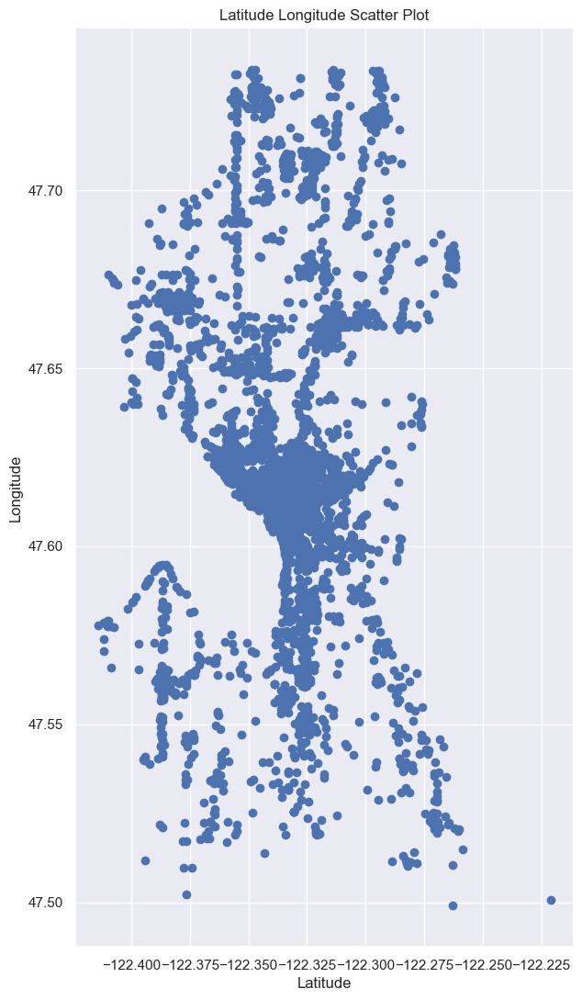

In [15]:

plt.figure(figsize=(7, 13))
plt.scatter(df['Longitude'], df['Latitude'])
plt.title('Latitude Longitude Scatter Plot')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.show()

In [16]:


x = df_geo['Latitude']
y = df_geo['Longitude']

lat = 47.6062095
long = -122.3320708


#Create a map of the area
base_map = folium.Map([lat, long], zoom_start=13)



In [17]:
#Generate some random locations to add to our map
x = [lat + np.random.uniform(-.1,.1) for i in range(20)]
y = [long + np.random.uniform(-.1,.1) for i in range(20)]
points = list(zip(x, y))
for p in points:
    lat = p[0]
    long = p[1]
    marker = folium.Marker(location=[lat, long])
    marker.add_to(base_map)
base_map

### REGROUPER DES COLONNES PAR THEME ET SUPPRIMER LES COLONNES 

In [18]:
df_na = df[df['Outlier'].isna()]
df_na


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,...,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,5.252517e+05,1.792159e+06,39737.390630,3.973739e+06,False,NaN,Compliant,NaN,223.54,16.99
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,1.022480e+05,3.488702e+05,3706.010010,3.706010e+05,False,NaN,Compliant,NaN,22.11,1.57


In [19]:
df_bui = df_na[df_na['BuildingType'].isin(['NonResidential', 'Nonresidential COS','Nonresidential WA'])]
df_bui

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,...,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,5.252517e+05,1.792159e+06,39737.390630,3.973739e+06,False,NaN,Compliant,NaN,223.54,16.99
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,1.022480e+05,3.488702e+05,3706.010010,3.706010e+05,False,NaN,Compliant,NaN,22.11,1.57


In [20]:
df_comp = df_bui[df_bui['ComplianceStatus'].isin(['Compliant'])]
df_comp

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,50221,2016,Nonresidential COS,Other,High Point Community Center,6920 34th Ave SW,Seattle,WA,NaN,2524039059,...,1.853347e+05,6.323620e+05,2997.199951,2.997200e+05,False,NaN,Compliant,NaN,20.33,1.11
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,5.252517e+05,1.792159e+06,39737.390630,3.973739e+06,False,NaN,Compliant,NaN,223.54,16.99
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,1.022480e+05,3.488702e+05,3706.010010,3.706010e+05,False,NaN,Compliant,NaN,22.11,1.57


### POUVOIR CALCULER L'AGE DU BATIMENT

In [21]:
df_comp['age_building'] = df_comp['DataYear'] - df_comp['YearBuilt']
df_comp


C:\Users\emili\AppData\Local\Temp\ipykernel_81112\2340791386.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp['age_building'] = df_comp['DataYear'] - df_comp['YearBuilt']


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,age_building
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83,89
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86,20
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19,47
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67,90
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,50221,2016,Nonresidential COS,Other,High Point Community Center,6920 34th Ave SW,Seattle,WA,NaN,2524039059,...,6.323620e+05,2997.199951,2.997200e+05,False,NaN,Compliant,NaN,20.33,1.11,34
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01,12
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,1.792159e+06,39737.390630,3.973739e+06,False,NaN,Compliant,NaN,223.54,16.99,42
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,3.488702e+05,3706.010010,3.706010e+05,False,NaN,Compliant,NaN,22.11,1.57,27


### POUVOIR CALCULER LA PART DES PARKINGS SUR L'ENSEMBLE DU BATIMENT

In [22]:
df_comp['part_park']= df_comp['PropertyGFAParking']/df_comp['PropertyGFATotal']*100
df_comp

C:\Users\emili\AppData\Local\Temp\ipykernel_81112\2231293881.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp['part_park']= df_comp['PropertyGFAParking']/df_comp['PropertyGFATotal']*100


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,age_building,part_park
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83,89,0.000000
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86,20,14.545314
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19,47,20.574829
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67,90,0.000000
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88,36,35.311539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,50221,2016,Nonresidential COS,Other,High Point Community Center,6920 34th Ave SW,Seattle,WA,NaN,2524039059,...,2997.199951,2.997200e+05,False,NaN,Compliant,NaN,20.33,1.11,34,0.000000
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01,12,0.000000
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,39737.390630,3.973739e+06,False,NaN,Compliant,NaN,223.54,16.99,42,0.000000
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,3706.010010,3.706010e+05,False,NaN,Compliant,NaN,22.11,1.57,27,0.000000


### POUVOIR CALCULER LA PART DES ENERGIES SUR L'ENSEMBLE DU BATIMENT


In [23]:
# On récupère l'énergie totale et les emissions de CO2
TotalEnergyUse = df["SiteEnergyUse(kBtu)"]
TotalCO2 = df["TotalGHGEmissions"]

# On calcule les proportions de chaque source d'énergie 
df_comp["Electricity_Part"] = df["Electricity(kBtu)"]/df["SiteEnergyUse(kBtu)"]
df_comp["NaturalGas_Part"] = df["NaturalGas(kBtu)"]/df["SiteEnergyUse(kBtu)"]
df_comp["SteamUse_Part"] = df["SteamUse(kBtu)"]/df["SiteEnergyUse(kBtu)"]
df_comp

C:\Users\emili\AppData\Local\Temp\ipykernel_81112\3292110090.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp["Electricity_Part"] = df["Electricity(kBtu)"]/df["SiteEnergyUse(kBtu)"]
C:\Users\emili\AppData\Local\Temp\ipykernel_81112\3292110090.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp["NaturalGas_Part"] = df["NaturalGas(kBtu)"]/df["SiteEnergyUse(kBtu)"]
C:\Users\emili\AppData\Local\Temp\ipykernel_81112\3292110090.py:8: SettingWithCopyWarning: 
A value is trying to be set on a cop

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,age_building,part_park,Electricity_Part,NaturalGas_Part,SteamUse_Part
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,NaN,Compliant,NaN,249.98,2.83,89,0.000000,0.546060,0.176638,0.277302
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,NaN,Compliant,NaN,295.86,2.86,20,14.545314,0.386609,0.613391,0.000000
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,NaN,Compliant,NaN,2089.28,2.19,47,20.574829,0.682307,0.020579,0.297113
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,NaN,Compliant,NaN,286.43,4.67,90,0.000000,0.407519,0.266567,0.325913
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,NaN,Compliant,NaN,505.01,2.88,36,35.311539,0.378802,0.621198,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,50221,2016,Nonresidential COS,Other,High Point Community Center,6920 34th Ave SW,Seattle,WA,NaN,2524039059,...,NaN,Compliant,NaN,20.33,1.11,34,0.000000,0.678440,0.321560,0.000000
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,NaN,Compliant,NaN,32.17,2.01,12,0.000000,0.417296,0.582704,0.000000
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,NaN,Compliant,NaN,223.54,16.99,42,0.000000,0.310820,0.689180,0.000000
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,NaN,Compliant,NaN,22.11,1.57,27,0.000000,0.484898,0.515102,0.000000


### VOIR L'EFFET DE l'ENERGY STAR SCORE

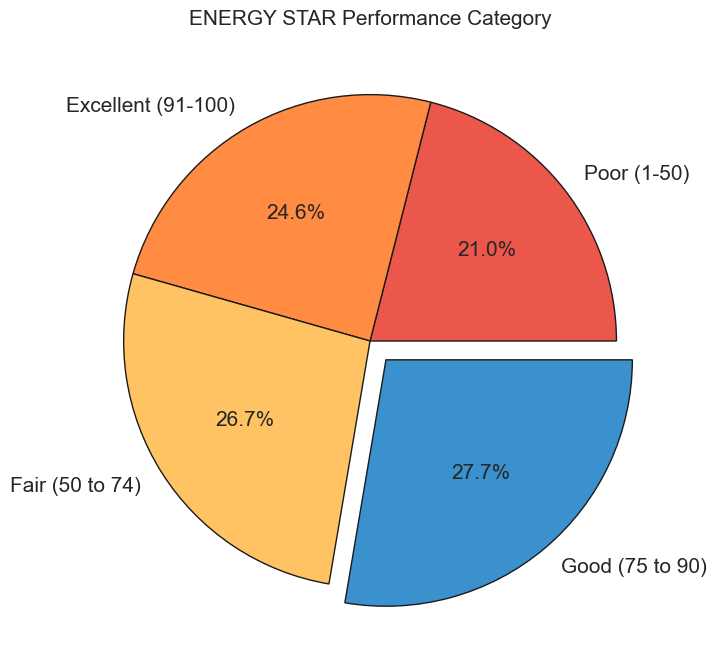

In [24]:
energy = pd.cut(df_comp['ENERGYSTARScore'], [1, 50, 74, 90, 100])  
count = energy.value_counts().sort_values()
category = ['Poor (1-50)', 'Excellent (91-100)', 'Fair (50 to 74)', 'Good (75 to 90)']

fig1, ax = plt.subplots(figsize=(8,8))
ax.pie(count, 
       labels=category,
       explode = [0, 0, 0, .1],
       autopct='%1.1f%%',
       colors = ["#eb574b", "#ff8c42", "#ffc363", "#3b91ce"],
       wedgeprops = {"ec": "k"}, 
       textprops = {"fontsize": 15}) 
ax.set_title('ENERGY STAR Performance Category', {"fontsize": 15})
plt.show()

### REGROUPER LES PRIMARY PROPERTY TYPE PAR GROUPE

In [25]:
df_comp['PrimaryPropertyType'] = df_comp['PrimaryPropertyType'].replace(['Distribution Center', 'Hospital', 'Hotel', 'K-12 School', 'Laboratory', 'Large Office', 'Low-Rise Multifamily', 'Medical Office', 'Mixed Use Property', 'Office', 'Other', 'Refrigerated Warehouse', 'Residence Hall', 'Restaurant', 'Retail Store', 'Self-Storage Facility', 'Senior Care Community', 'Small- and Mid-Sized Office', 'Supermarket / Grocery Store', 'University', 'Warehouse', 'Worship Facility'], ['Distribution', 'Medical', 'Hotel', 'School', 'Medical', 'Office', 'Other', 'Medical', 'Other', 'Office', 'Other', 'Distribution', 'Other', 'Distribution', 'Distribution', 'Distribution', 'Medical', 'Office', 'Distribution', 'School', 'Distribution', 'Other'])
df_comp

C:\Users\emili\AppData\Local\Temp\ipykernel_81112\3746021785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp['PrimaryPropertyType'] = df_comp['PrimaryPropertyType'].replace(['Distribution Center', 'Hospital', 'Hotel', 'K-12 School', 'Laboratory', 'Large Office', 'Low-Rise Multifamily', 'Medical Office', 'Mixed Use Property', 'Office', 'Other', 'Refrigerated Warehouse', 'Residence Hall', 'Restaurant', 'Retail Store', 'Self-Storage Facility', 'Senior Care Community', 'Small- and Mid-Sized Office', 'Supermarket / Grocery Store', 'University', 'Warehouse', 'Worship Facility'], ['Distribution', 'Medical', 'Hotel', 'School', 'Medical', 'Office', 'Other', 'Medical', 'Other', 'Office', 'Other', 'Distribution', 'Other', 'Distribution', 'Distri

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,age_building,part_park,Electricity_Part,NaturalGas_Part,SteamUse_Part
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,NaN,Compliant,NaN,249.98,2.83,89,0.000000,0.546060,0.176638,0.277302
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,NaN,Compliant,NaN,295.86,2.86,20,14.545314,0.386609,0.613391,0.000000
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,NaN,Compliant,NaN,2089.28,2.19,47,20.574829,0.682307,0.020579,0.297113
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,NaN,Compliant,NaN,286.43,4.67,90,0.000000,0.407519,0.266567,0.325913
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,NaN,Compliant,NaN,505.01,2.88,36,35.311539,0.378802,0.621198,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,50221,2016,Nonresidential COS,Other,High Point Community Center,6920 34th Ave SW,Seattle,WA,NaN,2524039059,...,NaN,Compliant,NaN,20.33,1.11,34,0.000000,0.678440,0.321560,0.000000
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,NaN,Compliant,NaN,32.17,2.01,12,0.000000,0.417296,0.582704,0.000000
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,NaN,Compliant,NaN,223.54,16.99,42,0.000000,0.310820,0.689180,0.000000
3374,50225,2016,Nonresidential COS,Other,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,NaN,Compliant,NaN,22.11,1.57,27,0.000000,0.484898,0.515102,0.000000


### REGROUPER LES LARGEST PROPERTY TYPE PAR GROUPE

In [26]:

df_comp['LargestPropertyUseType']=df_comp['LargestPropertyUseType'].dropna(axis=0,how="any")

C:\Users\emili\AppData\Local\Temp\ipykernel_81112\2004896323.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp['LargestPropertyUseType']=df_comp['LargestPropertyUseType'].dropna(axis=0,how="any")


In [27]:
df_comp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1514 entries, 0 to 3375
Data columns (total 51 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    1514 non-null   int64  
 1   DataYear                         1514 non-null   int64  
 2   BuildingType                     1514 non-null   object 
 3   PrimaryPropertyType              1514 non-null   object 
 4   PropertyName                     1514 non-null   object 
 5   Address                          1514 non-null   object 
 6   City                             1514 non-null   object 
 7   State                            1514 non-null   object 
 8   ZipCode                          1501 non-null   float64
 9   TaxParcelIdentificationNumber    1514 non-null   object 
 10  CouncilDistrictCode              1514 non-null   int64  
 11  Neighborhood                     1514 non-null   object 
 12  Latitude            

In [28]:
df_comp['LargestPropertyUseType'] = df_comp['LargestPropertyUseType'].replace(['Hotel', 'Police Station', 'Other - Entertainment/Public Assembly', 'Library', 'Fitness Center/Health Club/Gym', 'Social/Meeting Hall',
 'Courthouse', 'Other', 'College/University', 'Automobile Dealership', 'Office', 'Self-Storage Facility', 'Non-Refrigerated Warehouse', 'K-12 School', 'Other - Mall', 'Senior Care Community', 'Medical Office', 'Retail Store', 'Hospital (General Medical & Surgical)', 'Museum', 'Repair Services (Vehicle, Shoe, Locksmith, etc)', 'Other - Lodging/Residential', 'Residence Hall/Dormitory', 'Other/Specialty Hospital', 'Financial Office', 'Distribution Center', 'Parking', 'Multifamily Housing', 'Worship Facility', 'Restaurant', 'Data Center', 'Laboratory', 'Supermarket/Grocery Store', 'Urgent Care/Clinic/Other Outpatient', 'Other - Services', 'Strip Mall', 'Wholesale Club/Supercenter', 'Refrigerated Warehouse', 'Manufacturing/Industrial Plant', 'Other - Recreation', 'Lifestyle Center', 'Other - Public Services', 'Fire Station', 'Performing Arts', 'Residential Care Facility', 'Bank Branch', 'Other - Education', 'Other - Restaurant/Bar', 'Food Service',
 'Adult Education', 'Other - Utility', 'Movie Theater', 'Personal Services (Health/Beauty, Dry Cleaning, etc)', 'Pre-school/Daycare', 'Prison/Incarceration'], 
 ['Hotel', 'Legal', 'Culture', 'Culture', 'Sport', 'Office', 'Legal', 'Other', 'School', 'Distribution', 'Office', 'Distribution', 'Distribution', 'School', 'Distribution', 'Medical', 'Medical', 'Distribution', 'Medical', 'Culture', 'Distribution', 'Other', 'Other', 'Medical', 'Office', 'Distribution', 'Parking', 'Other', 'Other', 'Food', 'Other',' Medical', 'Distribution', 'Medical', 'Other', 'Distribution', 'Distribution', 'Distribution', 'Distribution', 'Culture', 'Medical', 'Other', 'Legal', 'Culture', 'Medical', 'Office', 'School', 'Food', 'Food', 'School', 'Other', 'Culture', 'Other', 'School', 'Legal'])
df_comp

C:\Users\emili\AppData\Local\Temp\ipykernel_81112\3036941213.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp['LargestPropertyUseType'] = df_comp['LargestPropertyUseType'].replace(['Hotel', 'Police Station', 'Other - Entertainment/Public Assembly', 'Library', 'Fitness Center/Health Club/Gym', 'Social/Meeting Hall',


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,age_building,part_park,Electricity_Part,NaturalGas_Part,SteamUse_Part
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,NaN,Compliant,NaN,249.98,2.83,89,0.000000,0.546060,0.176638,0.277302
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,NaN,Compliant,NaN,295.86,2.86,20,14.545314,0.386609,0.613391,0.000000
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,NaN,Compliant,NaN,2089.28,2.19,47,20.574829,0.682307,0.020579,0.297113
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,NaN,Compliant,NaN,286.43,4.67,90,0.000000,0.407519,0.266567,0.325913
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,NaN,Compliant,NaN,505.01,2.88,36,35.311539,0.378802,0.621198,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,50221,2016,Nonresidential COS,Other,High Point Community Center,6920 34th Ave SW,Seattle,WA,NaN,2524039059,...,NaN,Compliant,NaN,20.33,1.11,34,0.000000,0.678440,0.321560,0.000000
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,NaN,Compliant,NaN,32.17,2.01,12,0.000000,0.417296,0.582704,0.000000
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,NaN,Compliant,NaN,223.54,16.99,42,0.000000,0.310820,0.689180,0.000000
3374,50225,2016,Nonresidential COS,Other,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,NaN,Compliant,NaN,22.11,1.57,27,0.000000,0.484898,0.515102,0.000000


### MODIFIER LES COLONNES D'ENERGIE EN VALEUR BOOLEENNE POUR VOIR L'USAGE OU LE NON USAGE

In [29]:
df_comp['Electricity_Use'] = (df_comp['Electricity(kBtu)']>0).astype(int)
df_comp['SteamUse_Use'] = (df_comp['SteamUse(kBtu)']>0).astype(int)
df_comp['NaturalGas_Use'] = (df_comp['NaturalGas(kBtu)']>0).astype(int)
df_comp

C:\Users\emili\AppData\Local\Temp\ipykernel_81112\3723827667.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp['Electricity_Use'] = (df_comp['Electricity(kBtu)']>0).astype(int)
C:\Users\emili\AppData\Local\Temp\ipykernel_81112\3723827667.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp['SteamUse_Use'] = (df_comp['SteamUse(kBtu)']>0).astype(int)
C:\Users\emili\AppData\Local\Temp\ipykernel_81112\3723827667.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fro

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,TotalGHGEmissions,GHGEmissionsIntensity,age_building,part_park,Electricity_Part,NaturalGas_Part,SteamUse_Part,Electricity_Use,SteamUse_Use,NaturalGas_Use
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,249.98,2.83,89,0.000000,0.546060,0.176638,0.277302,1,1,1
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,295.86,2.86,20,14.545314,0.386609,0.613391,0.000000,1,0,1
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,2089.28,2.19,47,20.574829,0.682307,0.020579,0.297113,1,1,1
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,286.43,4.67,90,0.000000,0.407519,0.266567,0.325913,1,1,1
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,505.01,2.88,36,35.311539,0.378802,0.621198,0.000000,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,50221,2016,Nonresidential COS,Other,High Point Community Center,6920 34th Ave SW,Seattle,WA,NaN,2524039059,...,20.33,1.11,34,0.000000,0.678440,0.321560,0.000000,1,0,1
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,32.17,2.01,12,0.000000,0.417296,0.582704,0.000000,1,0,1
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,223.54,16.99,42,0.000000,0.310820,0.689180,0.000000,1,0,1
3374,50225,2016,Nonresidential COS,Other,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,22.11,1.57,27,0.000000,0.484898,0.515102,0.000000,1,0,1


### RECREER UN DATA FRAME POUR LA PARTIE MACHINE LEARNING

In [30]:
df_comp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1514 entries, 0 to 3375
Data columns (total 54 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    1514 non-null   int64  
 1   DataYear                         1514 non-null   int64  
 2   BuildingType                     1514 non-null   object 
 3   PrimaryPropertyType              1514 non-null   object 
 4   PropertyName                     1514 non-null   object 
 5   Address                          1514 non-null   object 
 6   City                             1514 non-null   object 
 7   State                            1514 non-null   object 
 8   ZipCode                          1501 non-null   float64
 9   TaxParcelIdentificationNumber    1514 non-null   object 
 10  CouncilDistrictCode              1514 non-null   int64  
 11  Neighborhood                     1514 non-null   object 
 12  Latitude            

In [31]:
df_final=df_comp[['PrimaryPropertyType','LargestPropertyUseType', 'PropertyGFATotal', 'NumberofBuildings', 'NumberofFloors', 'SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions', 'Electricity_Use', 'Electricity_Part', 'SteamUse_Use', 'SteamUse_Part', 'NaturalGas_Use', 'NaturalGas_Part', 'ENERGYSTARScore',  
'age_building', 'part_park', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'PropertyGFABuilding(s)', 'GHGEmissionsIntensity']]

In [32]:
df_final

,PrimaryPropertyType,LargestPropertyUseType,PropertyGFATotal,NumberofBuildings,NumberofFloors,SiteEnergyUseWN(kBtu),TotalGHGEmissions,Electricity_Use,Electricity_Part,SteamUse_Use,...,ENERGYSTARScore,age_building,part_park,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),PropertyGFABuilding(s),GHGEmissionsIntensity
0,Hotel,Hotel,88434,1.0,12,7.456910e+06,249.98,1,0.546060,1,...,60.0,89,0.000000,81.699997,84.300003,182.500000,189.000000,7.226362e+06,88434,2.83
1,Hotel,Hotel,103566,1.0,11,8.664479e+06,295.86,1,0.386609,0,...,61.0,20,14.545314,94.800003,97.900002,176.100006,179.399994,8.387933e+06,88502,2.86
2,Hotel,Hotel,956110,1.0,41,7.393711e+07,2089.28,1,0.682307,1,...,43.0,47,20.574829,96.000000,97.699997,241.899994,244.100006,7.258702e+07,759392,2.19
3,Hotel,Hotel,61320,1.0,10,6.946800e+06,286.43,1,0.407519,1,...,56.0,90,0.000000,110.800003,113.300003,216.199997,224.000000,6.794584e+06,61320,4.67
4,Hotel,Hotel,175580,1.0,18,1.465650e+07,505.01,1,0.378802,0,...,75.0,36,35.311539,114.800003,118.699997,211.399994,215.600006,1.417261e+07,113580,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,Other,Culture,18261,1.0,1,1.025432e+06,20.33,1,0.678440,0,...,NaN,34,0.000000,51.000000,56.200001,126.000000,136.600006,9.320821e+05,18261,1.11
3372,Other,Culture,16000,1.0,1,1.053706e+06,32.17,1,0.417296,0,...,NaN,12,0.000000,59.400002,65.900002,114.199997,118.900002,9.502762e+05,16000,2.01
3373,Other,Culture,13157,1.0,1,6.053764e+06,223.54,1,0.310820,0,...,NaN,42,0.000000,438.200012,460.100006,744.799988,767.799988,5.765898e+06,13157,16.99
3374,Other,Culture,14101,1.0,1,7.828413e+05,22.11,1,0.484898,0,...,NaN,27,0.000000,51.000000,55.500000,105.300003,110.800003,7.194712e+05,14101,1.57


df_final.to_csv('df_pour_explo.csv', index=False)

In [33]:
cat_e = df_final.select_dtypes(include=['object']).columns
cat_e

Index(['PrimaryPropertyType', 'LargestPropertyUseType'], dtype='object')

In [34]:
num_e = df_final.select_dtypes(include=['number']).columns
num_e

Index(['PropertyGFATotal', 'NumberofBuildings', 'NumberofFloors',
       'SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions', 'Electricity_Use',
       'Electricity_Part', 'SteamUse_Use', 'SteamUse_Part', 'NaturalGas_Use',
       'NaturalGas_Part', 'ENERGYSTARScore', 'age_building', 'part_park',
       'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)',
       'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'PropertyGFABuilding(s)',
       'GHGEmissionsIntensity'],
      dtype='object')

In [35]:
df_final

,PrimaryPropertyType,LargestPropertyUseType,PropertyGFATotal,NumberofBuildings,NumberofFloors,SiteEnergyUseWN(kBtu),TotalGHGEmissions,Electricity_Use,Electricity_Part,SteamUse_Use,...,ENERGYSTARScore,age_building,part_park,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),PropertyGFABuilding(s),GHGEmissionsIntensity
0,Hotel,Hotel,88434,1.0,12,7.456910e+06,249.98,1,0.546060,1,...,60.0,89,0.000000,81.699997,84.300003,182.500000,189.000000,7.226362e+06,88434,2.83
1,Hotel,Hotel,103566,1.0,11,8.664479e+06,295.86,1,0.386609,0,...,61.0,20,14.545314,94.800003,97.900002,176.100006,179.399994,8.387933e+06,88502,2.86
2,Hotel,Hotel,956110,1.0,41,7.393711e+07,2089.28,1,0.682307,1,...,43.0,47,20.574829,96.000000,97.699997,241.899994,244.100006,7.258702e+07,759392,2.19
3,Hotel,Hotel,61320,1.0,10,6.946800e+06,286.43,1,0.407519,1,...,56.0,90,0.000000,110.800003,113.300003,216.199997,224.000000,6.794584e+06,61320,4.67
4,Hotel,Hotel,175580,1.0,18,1.465650e+07,505.01,1,0.378802,0,...,75.0,36,35.311539,114.800003,118.699997,211.399994,215.600006,1.417261e+07,113580,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,Other,Culture,18261,1.0,1,1.025432e+06,20.33,1,0.678440,0,...,NaN,34,0.000000,51.000000,56.200001,126.000000,136.600006,9.320821e+05,18261,1.11
3372,Other,Culture,16000,1.0,1,1.053706e+06,32.17,1,0.417296,0,...,NaN,12,0.000000,59.400002,65.900002,114.199997,118.900002,9.502762e+05,16000,2.01
3373,Other,Culture,13157,1.0,1,6.053764e+06,223.54,1,0.310820,0,...,NaN,42,0.000000,438.200012,460.100006,744.799988,767.799988,5.765898e+06,13157,16.99
3374,Other,Culture,14101,1.0,1,7.828413e+05,22.11,1,0.484898,0,...,NaN,27,0.000000,51.000000,55.500000,105.300003,110.800003,7.194712e+05,14101,1.57


### ENCODAGE VARIABLE

In [36]:
df_encoder = pd.get_dummies(df_final, columns=cat_e, drop_first=True)

In [37]:
df_encoder

,PropertyGFATotal,NumberofBuildings,NumberofFloors,SiteEnergyUseWN(kBtu),TotalGHGEmissions,Electricity_Use,Electricity_Part,SteamUse_Use,SteamUse_Part,NaturalGas_Use,...,LargestPropertyUseType_Distribution,LargestPropertyUseType_Food,LargestPropertyUseType_Hotel,LargestPropertyUseType_Legal,LargestPropertyUseType_Medical,LargestPropertyUseType_Office,LargestPropertyUseType_Other,LargestPropertyUseType_Parking,LargestPropertyUseType_School,LargestPropertyUseType_Sport
0,88434,1.0,12,7.456910e+06,249.98,1,0.546060,1,0.277302,1,...,0,0,1,0,0,0,0,0,0,0
1,103566,1.0,11,8.664479e+06,295.86,1,0.386609,0,0.000000,1,...,0,0,1,0,0,0,0,0,0,0
2,956110,1.0,41,7.393711e+07,2089.28,1,0.682307,1,0.297113,1,...,0,0,1,0,0,0,0,0,0,0
3,61320,1.0,10,6.946800e+06,286.43,1,0.407519,1,0.325913,1,...,0,0,1,0,0,0,0,0,0,0
4,175580,1.0,18,1.465650e+07,505.01,1,0.378802,0,0.000000,1,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,18261,1.0,1,1.025432e+06,20.33,1,0.678440,0,0.000000,1,...,0,0,0,0,0,0,0,0,0,0
3372,16000,1.0,1,1.053706e+06,32.17,1,0.417296,0,0.000000,1,...,0,0,0,0,0,0,0,0,0,0
3373,13157,1.0,1,6.053764e+06,223.54,1,0.310820,0,0.000000,1,...,0,0,0,0,0,0,0,0,0,0
3374,14101,1.0,1,7.828413e+05,22.11,1,0.484898,0,0.000000,1,...,0,0,0,0,0,0,0,0,0,0


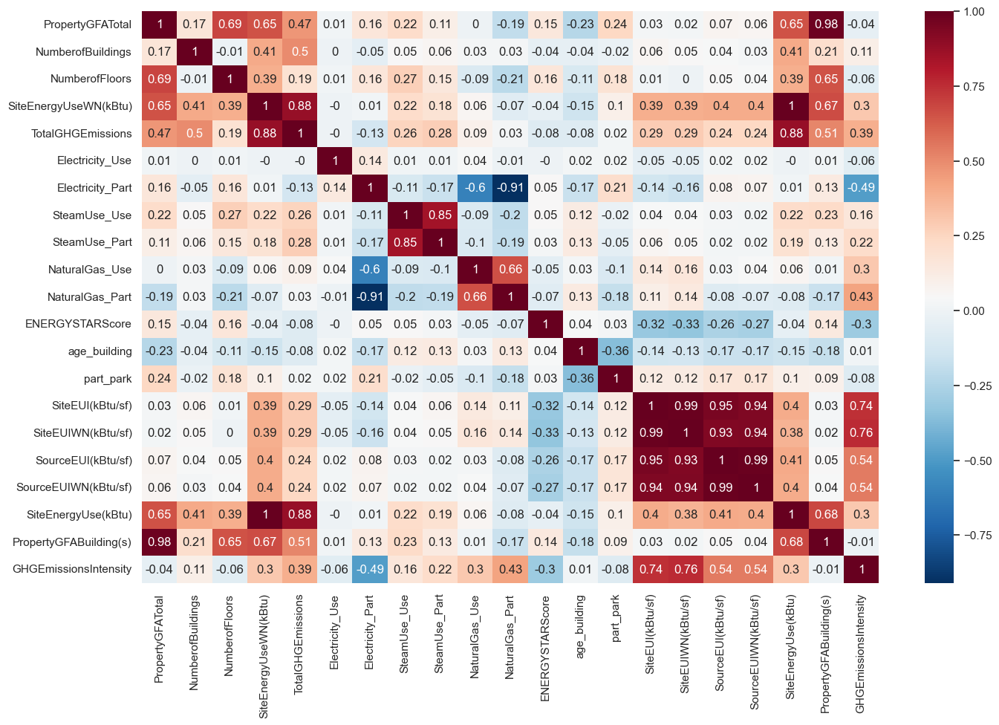

In [38]:
matrix_corr  = df_final.corr().round(2)
plt.figure(figsize = (16,10))
sns.heatmap(matrix_corr, cmap = 'RdBu_r', annot = True)
plt.show()  

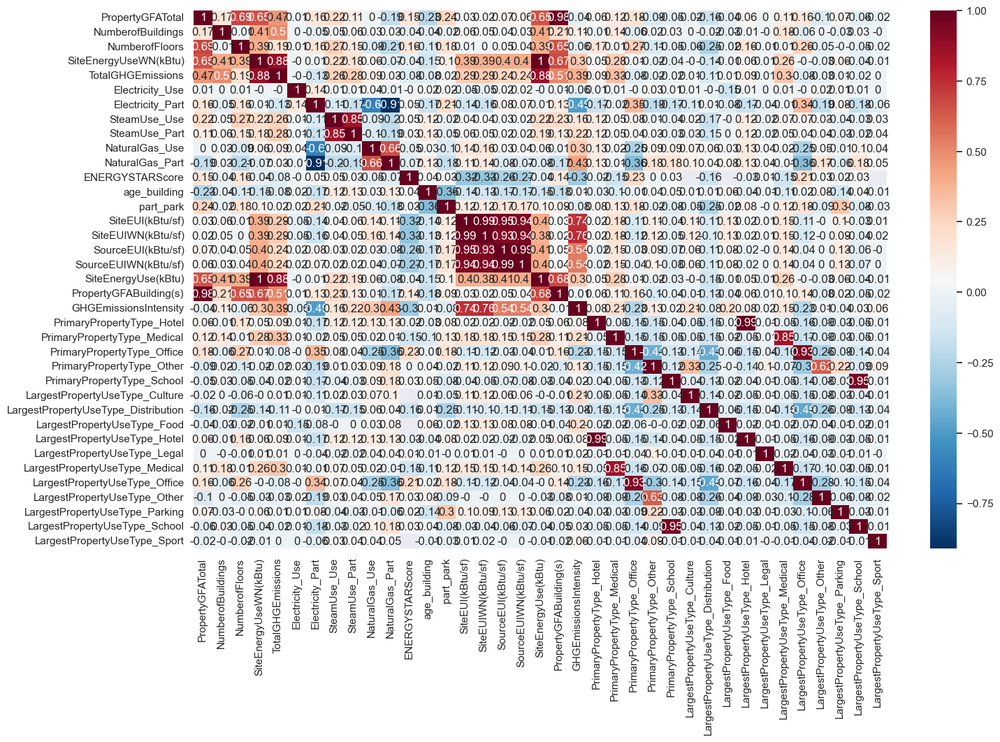

In [39]:
matrix_corr  = df_encoder.corr().round(2)
plt.figure(figsize = (16,10))
sns.heatmap(matrix_corr, cmap = 'RdBu_r', annot = True)
plt.show()  

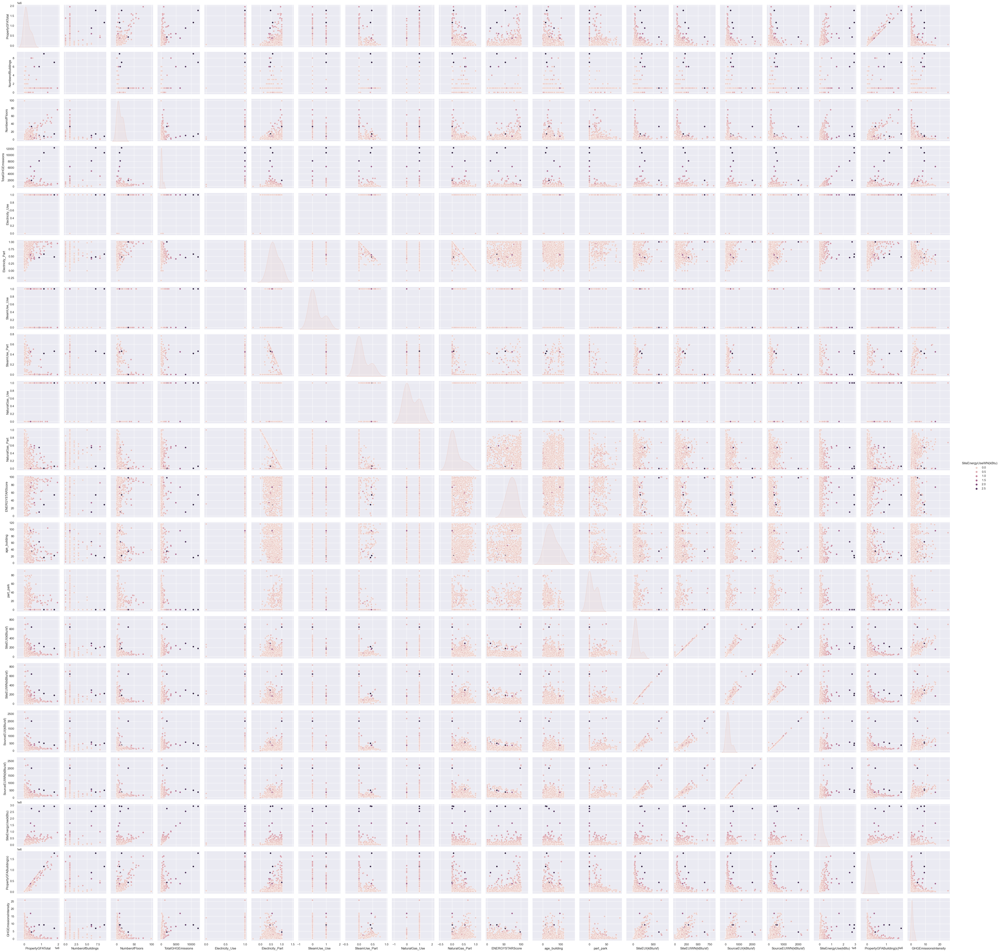

In [40]:
sns.pairplot(df_final.drop('PrimaryPropertyType', axis=1), hue="SiteEnergyUseWN(kBtu)")

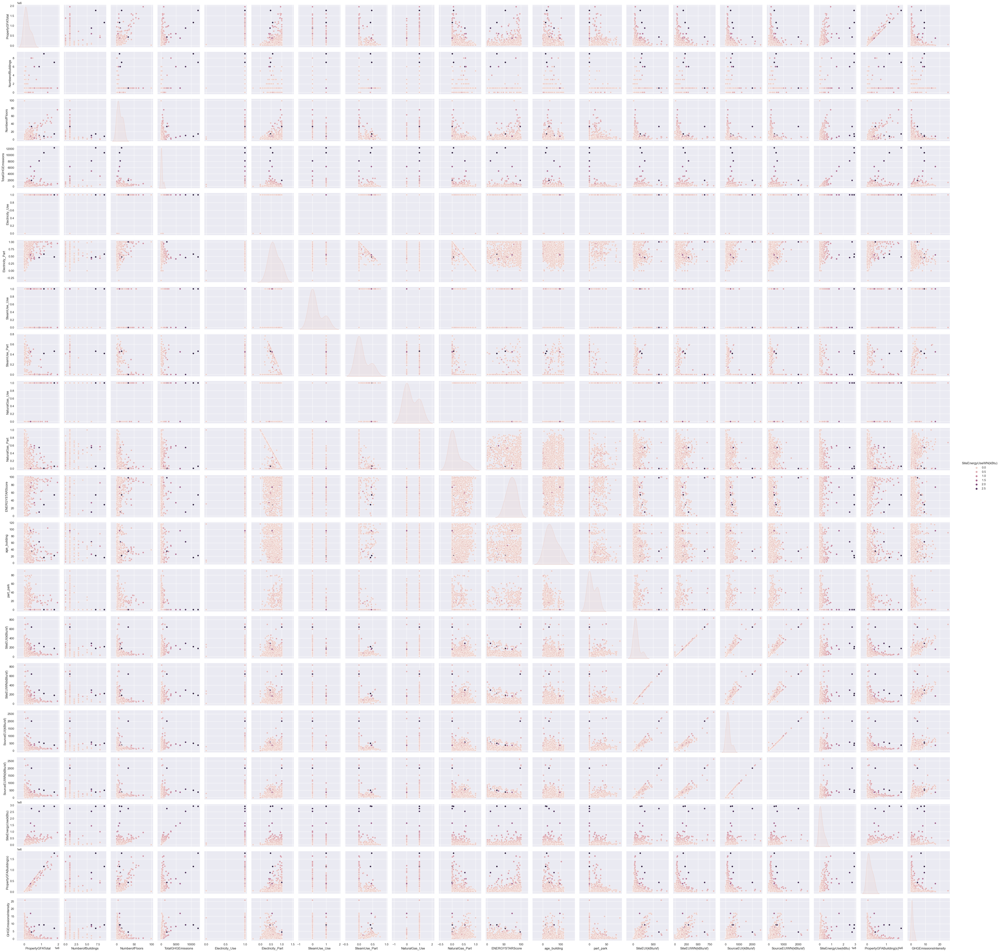

In [41]:
sns.pairplot(df_final, hue='SiteEnergyUseWN(kBtu)')


In [ ]:
sns.pairplot(df_encoder, hue='SiteEnergyUseWN(kBtu)')


In [ ]:
sns.pairplot(df_final, hue='TotalGHGEmissions')


In [ ]:
sns.pairplot(df_encoder, hue='TotalGHGEmissions')


df_encoder.to_csv('df_encoder_pour_explo.csv', index=False)